In [1]:
#Import

import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint
from biasmodels import MagnificationBias, GalaxyBias, EvolutionBias
from multipole_signal import Signal, Derivatives
from getdist import plots
from getdist.gaussian_mixtures import GaussianND
import fishermat as fm
import pickle as pk

#Set current directory
import os
import sys

PACKAGE_PARENT = '..'
SCRIPT_DIR = os.path.dirname(os.path.realpath(os.path.join(os.getcwd())))
sys.path.append(SCRIPT_DIR)
print(SCRIPT_DIR)

#Configuration
large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large,
          'xtick.direction': 'out',  
          'ytick.direction': 'out',  
          'xtick.minor.visible': True,  
          'ytick.minor.visible': True,
          'xtick.major.size': 9,
          'xtick.minor.size': 4.5,
          'ytick.major.size': 9,
          'ytick.minor.size': 4.5,
          'lines.linewidth': 1.75}
plt.rcParams.update(params)

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

/Users/danielsb/Documents/GitHub


In [2]:
# Redshift bins

z_bins = np.array([0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95, 1.05, 1.15, 1.25, 1.35, 1.45, 1.55, 1.65, 1.75, 1.85, 1.95])

# Separations

dist = [
    np.arange(20, 164, 4),
    np.arange(32, 164, 4),
]

params_dict0 = {
    'h' : 0.6766,
    'As' : 2.05e-9,
    'ns' : 0.9665,
    'Ob' : 0.04897, # This is here the density parameter of Baryons
    'Om' : 0.3111, # This is here the density parameter of Cold Dark Matter
}

steps = [1e-3, 1e-1, 1e-4, 1e-2, 1e-2]

#myDerivatives = Derivatives(params_dict0 = params_dict0,  wide_angle = False, dist_correction = False)

# Derivatives

In [3]:
with open('derivatives.pkl', 'rb') as File:
    derivatives_dict = pk.load(File)
    
derivatives_50x50 = derivatives_dict['split_50x50']
derivatives_30x70 = derivatives_dict['split_30x70']

In [4]:
dsignal_dsbias_fit = derivatives_50x50['dsignal_dsbias']

dsignal_dgbias =  derivatives_50x50['dsignal_dgbias']

dsignal_dcosmic =  derivatives_50x50['dsignal_dcosmic']

dsignal_dnum_fit =  derivatives_50x50['dsignal_dnumev']

np.shape(dsignal_dsbias_fit), np.shape(dsignal_dgbias), np.shape(dsignal_dcosmic)

((8, 19, 324), (4, 19, 324), (5, 19, 324))

In [5]:
dsignal_dtheta_fit_all = np.concatenate([dsignal_dsbias_fit, dsignal_dnum_fit, dsignal_dgbias, dsignal_dcosmic])

np.shape(dsignal_dtheta_fit_all)

(21, 19, 324)

## Plots

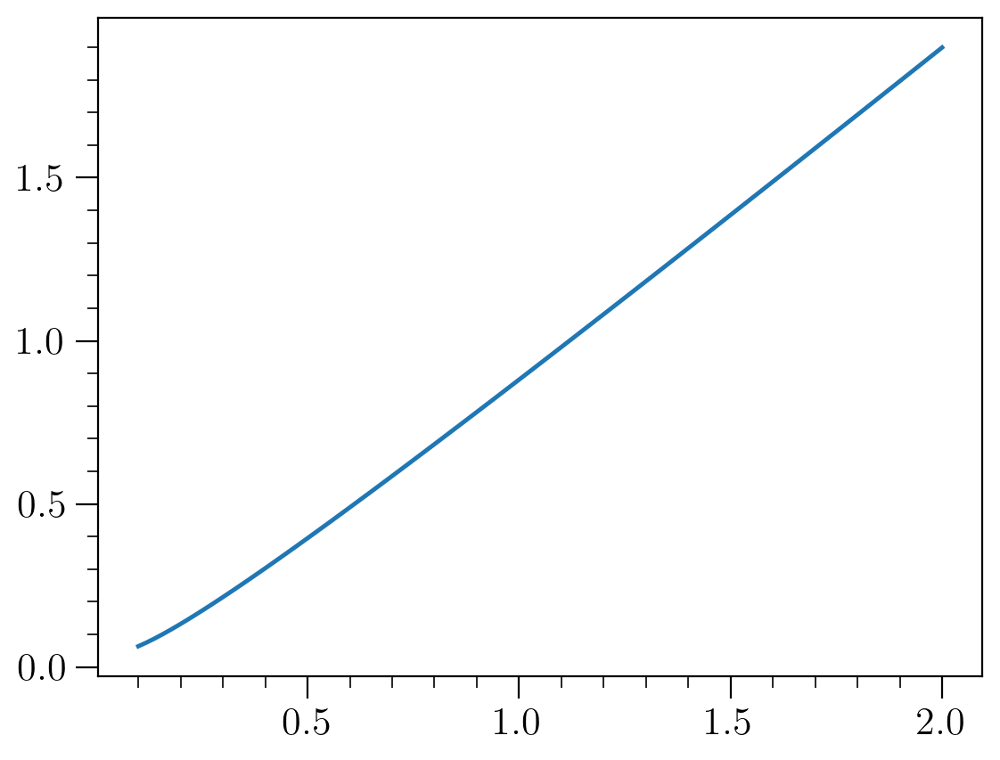

In [6]:
# Fitting model

sM_4fit = np.array([-0.19376095,  1.0747336,  -0.07806247, -0.00558005])

def sM_fit(pars, z_bins):
    z = np.array(z_bins)
    return pars[0] + pars[1] * z +  pars[2] * np.log(z) + pars[3]*np.log(z)**2

z_bins_ = np.linspace(0.1, 2.0, 100)

plt.plot(z_bins_, sM_fit(sM_4fit, z_bins_))

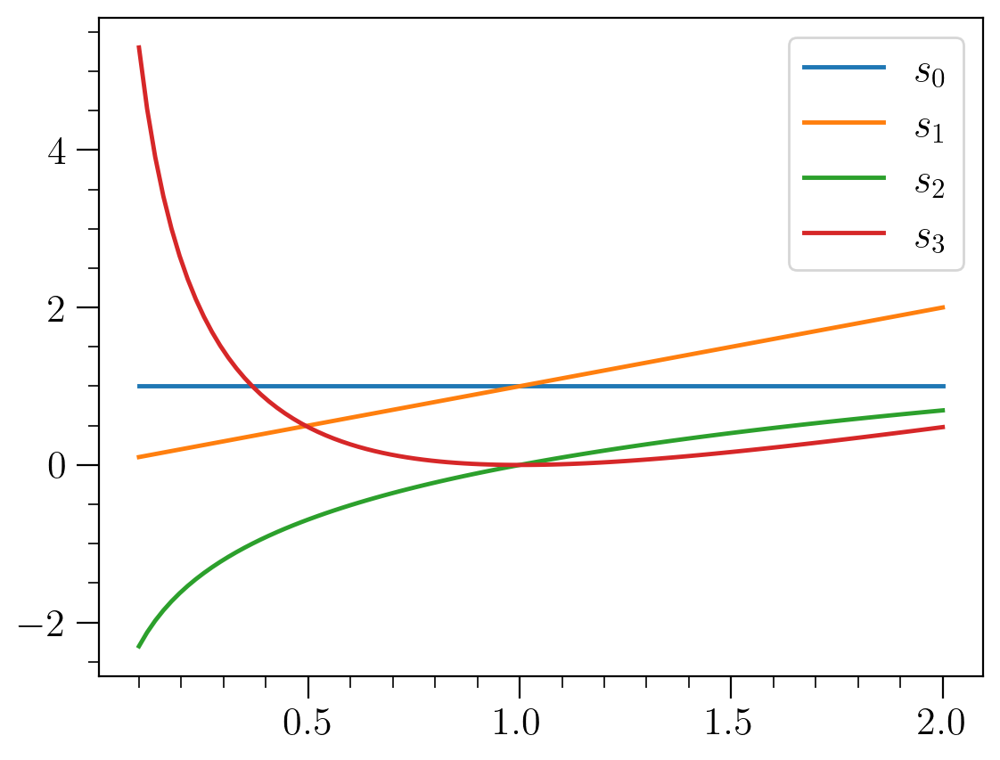

In [7]:
# Compare the factors

plt.plot(z_bins_, [1]*len(z_bins_), label = r'$s_0$') 
plt.plot(z_bins_, z_bins_, label = r'$s_1$')
plt.plot(z_bins_, np.log(z_bins_), label = r'$s_2$')
plt.plot(z_bins_, (np.log(z_bins_))**2,label = r'$s_3$')

plt.legend()

In [8]:
np.shape(dsignal_dsbias_fit)

(8, 19, 324)

In [9]:
dsignal_dsM_fit = dsignal_dsbias_fit[4:,:,:]

np.shape(dsignal_dsM_fit)

(4, 19, 324)

In [10]:
dsignal_dsM3_fit = dsignal_dsM_fit[3,:,:]

np.shape(dsignal_dsM3_fit)

(19, 324)

In [11]:
for k,_ in enumerate(z_bins):
    print(k)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


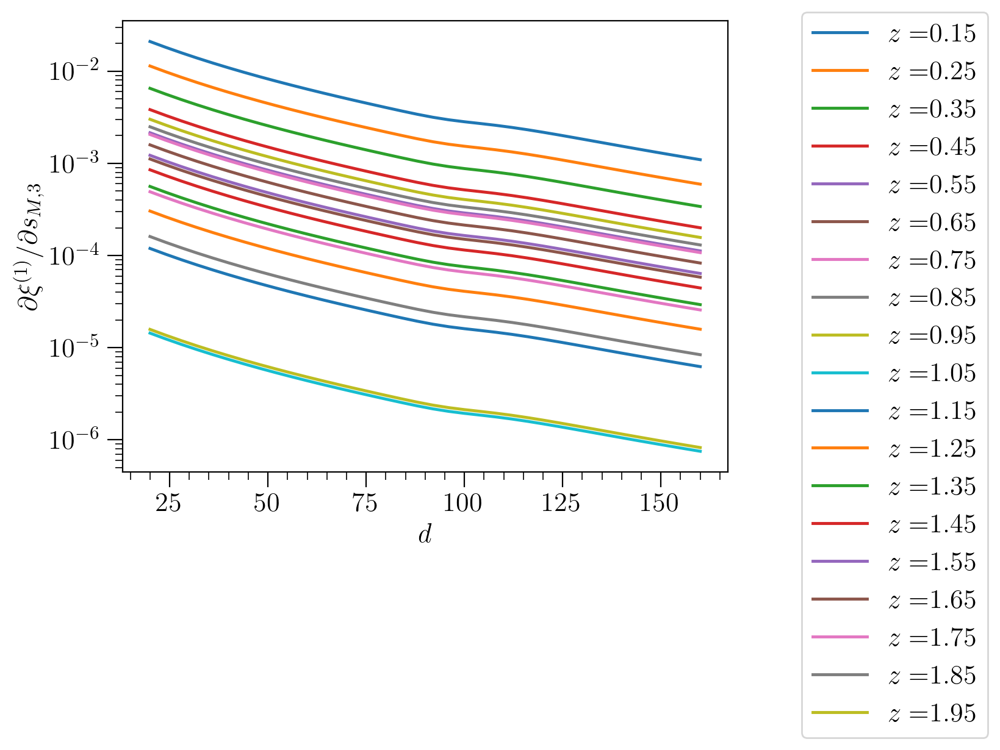

In [12]:
for k,_ in enumerate(z_bins):
    plt.plot(dist[0], dsignal_dsM3_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_))
    
plt.yscale('log')
plt.xlabel(r'$d$')
plt.ylabel(r'$\partial\xi^{(1)}/\partial s_{M,3}$')
plt.legend(bbox_to_anchor=(1.1, 1.05))


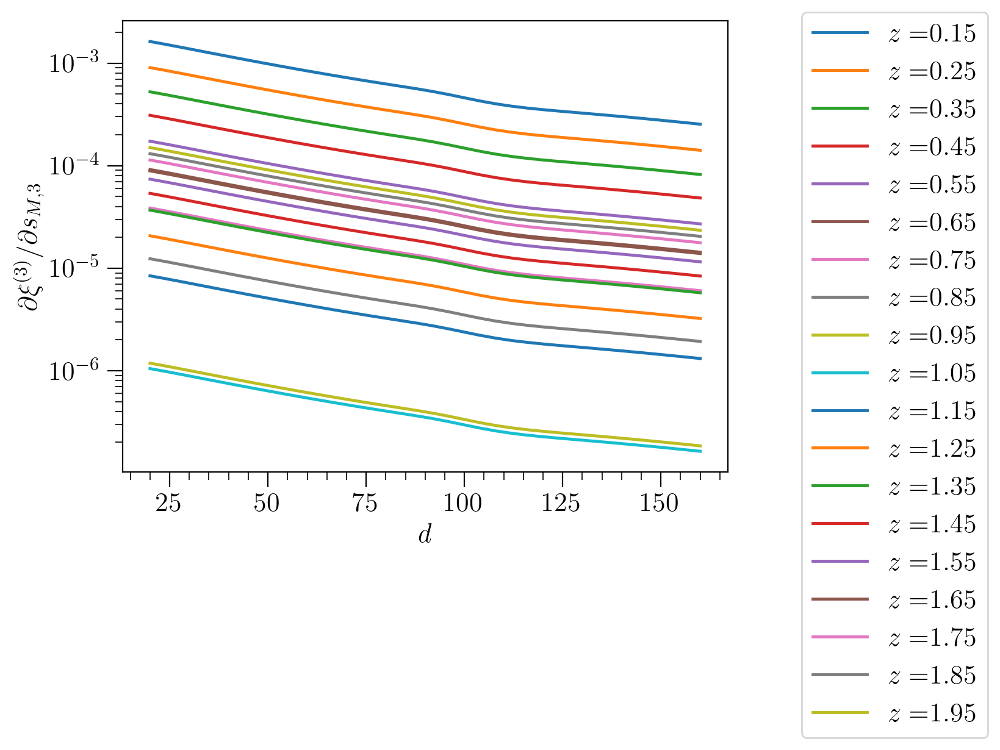

In [13]:
for k,_ in enumerate(z_bins):
    plt.plot(dist[0], dsignal_dsM3_fit[k,int(8*36):int(9*36)], label=r'$z=$'+str(_))
    
plt.yscale('log')
plt.xlabel(r'$d$')
plt.ylabel(r'$\partial\xi^{(3)}/\partial s_{M,3}$')
plt.legend(bbox_to_anchor=(1.1, 1.05))

In [14]:
from CAMBsolver import Solver

m_split = 2.

mySolver = Solver(zs=[0.0], **params_dict0, NonLin=False, silent=True)
mySignals = Signal(solver=mySolver, n_split=m_split, which_multipoles=['monopole', 'dipole', 'quadrupole', 'hexadecapole', 'octupole'], wide_angle=False, return_lists=True, evol_bias=True)

multipoles_signals = mySignals.calculate_signal(d = dist[0], z = z_bins)

In [15]:
np.shape(multipoles_signals)

(9, 19, 36)

In [16]:
monopoleBB = multipoles_signals[0]
monopoleBF = multipoles_signals[1]
monopoleFF = multipoles_signals[2]
dipoleBF = multipoles_signals[3]
quadrupoleBB = multipoles_signals[4]
quadrupoleBF = multipoles_signals[5]
quadrupoleFF = multipoles_signals[6]
hexadecapoleTT = multipoles_signals[7]
octupoleBF = multipoles_signals[8]

In [17]:
np.shape(octupoleBF), np.shape(dipoleBF)

((19, 36), (19, 36))

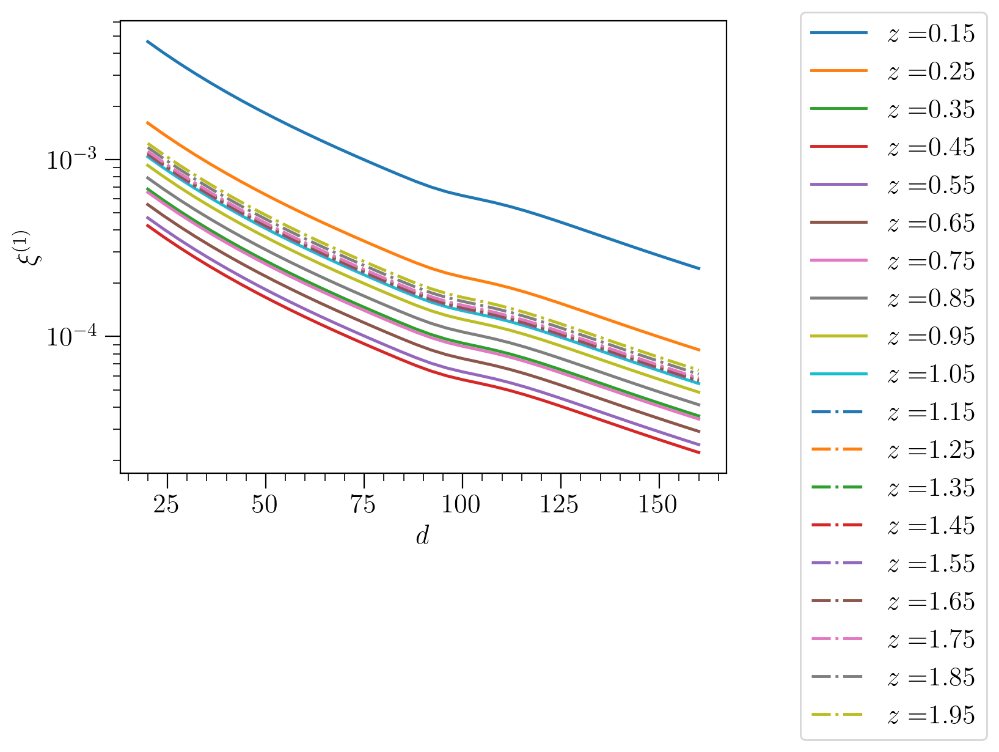

In [31]:
for k,_ in enumerate(z_bins):
    if _ < 1.15:
        plt.plot(dist[0], dipoleBF[k], '-', label=r'$z=$'+str(_))
    else:
        plt.plot(dist[0], dipoleBF[k], '-.', label=r'$z=$'+str(_))

    
plt.yscale('log')
plt.xlabel(r'$d$')
plt.ylabel(r'$\xi^{(1)}$')
plt.legend(bbox_to_anchor=(1.1, 1.05))

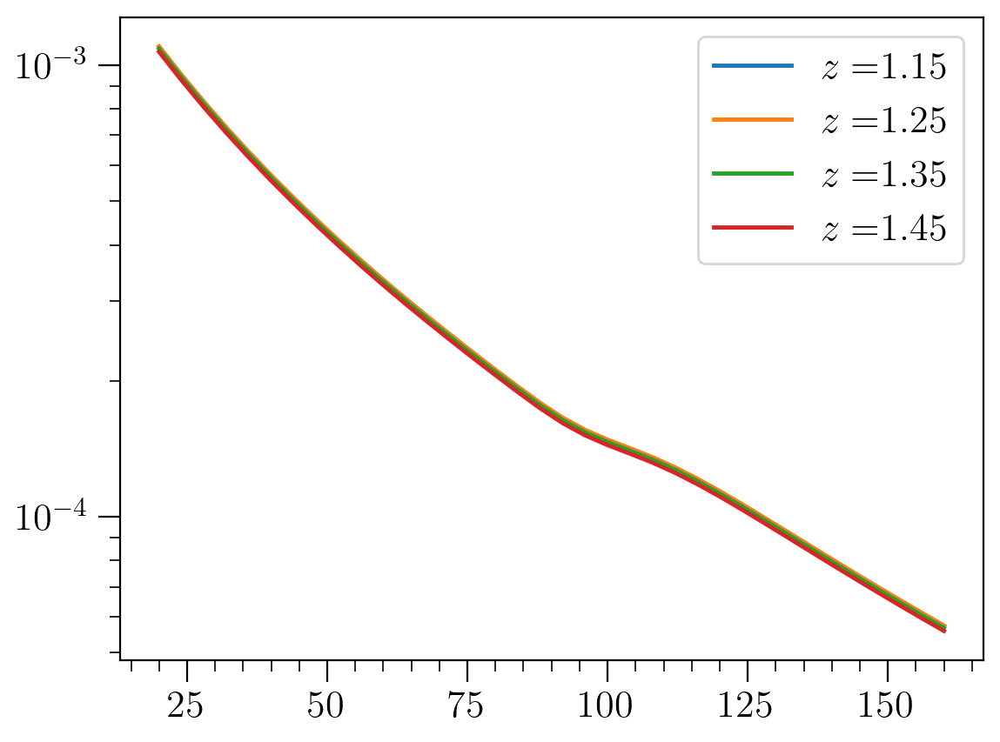

In [47]:
plt.plot(dist[0], dipoleBF[10], label=r'$z=$'+str(z_bins[10]))
plt.plot(dist[0], dipoleBF[11], label=r'$z=$'+str(z_bins[11]))
plt.plot(dist[0], dipoleBF[12], label=r'$z=$'+str(z_bins[12]))
plt.plot(dist[0], dipoleBF[13], label=r'$z=$'+str(z_bins[13]))

plt.yscale('log')
plt.legend()

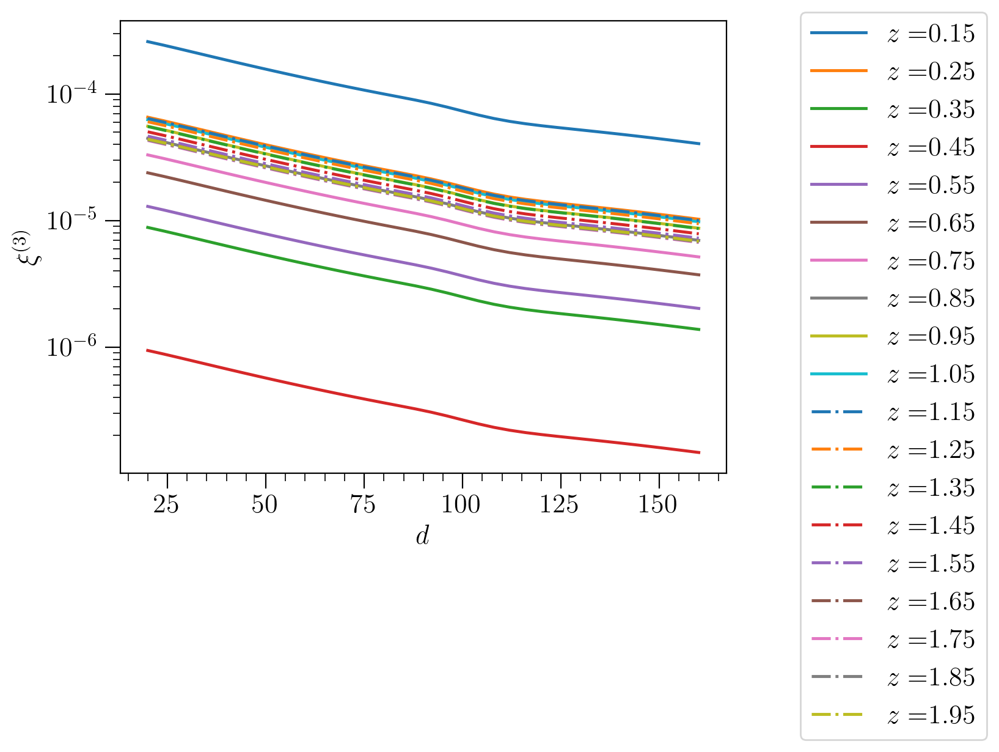

In [48]:
for k,_ in enumerate(z_bins):
    if _ < 1.15:
        plt.plot(dist[0], octupoleBF[k], '-', label=r'$z=$'+str(_))
    else:
        plt.plot(dist[0], octupoleBF[k], '-.', label=r'$z=$'+str(_))

    
plt.yscale('log')
plt.xlabel(r'$d$')
plt.ylabel(r'$\xi^{(3)}$')
plt.legend(bbox_to_anchor=(1.1, 1.05))

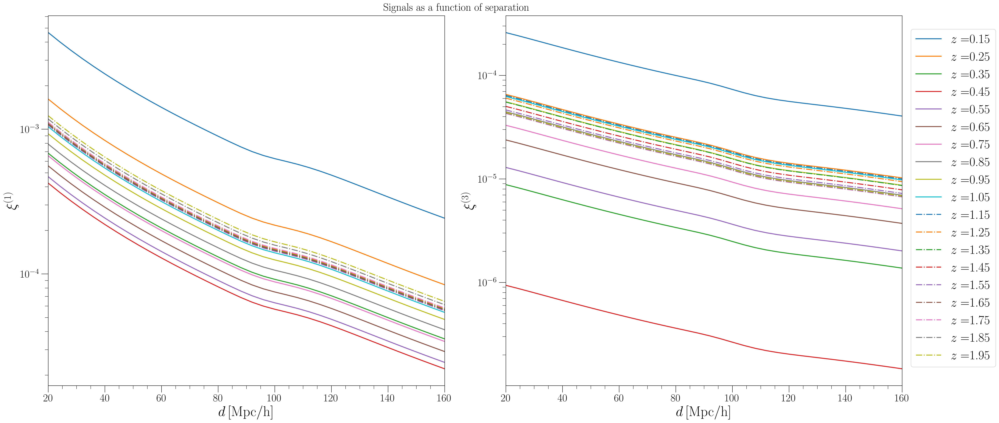

In [99]:
# Create a grid of plots (1 rows, 2 columns)

fig, axs = plt.subplots(1, 2, figsize=(26, 12), gridspec_kw={'hspace' : 0.0})

lss = ['-', '-.']

sep = dist[0]

line_width = 2.0

for k,_ in enumerate(z_bins):
    if _ < 1.15:
        axs[0].plot(dist[0], dipoleBF[k], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[0])
        axs[1].plot(dist[0], octupoleBF[k], linewidth = line_width, ls = lss[0])
    else:
        axs[0].plot(dist[0], dipoleBF[k], linewidth = line_width, label=r'$z=$'+str(_), ls = lss[1])
        axs[1].plot(dist[0], octupoleBF[k], linewidth = line_width, ls = lss[1])
        

# Set y-axis labels for the first column (1st subplot in each row)

axs[0].set_ylabel(r'$\xi^{(1)}$')
axs[1].set_ylabel(r'$\xi^{(3)}$')

axs[0].set_yscale('log')
axs[1].set_yscale('log')

# Add extra space between y-axis label and tick params

#axs[0, 0].yaxis.set_label_coords(-0.095, 0.5)
#axs[1, 0].yaxis.set_label_coords(-0.075, 0.5)
#axs[0, 1].yaxis.set_label_coords(-0.1175, 0.5)
#axs[1, 1].yaxis.set_label_coords(-0.075, 0.5)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[i].set_xlim(left=20, right=160)
    axs[i].set_xlim(left=20, right=160)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')
    axs[i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')

# Increase tick, label, and legend font sizes

for i in range(2):
        axs[i].tick_params(axis='both', which='major', labelsize=22, size=14)
        axs[i].tick_params(axis='both', which='minor', size=7)
        axs[i].xaxis.label.set_size(29)
        axs[i].yaxis.label.set_size(29)
        

# Create a legend for the first subplot (axs[0, 0])

fig.suptitle('Signals as a function of separation')

fig.legend(bbox_to_anchor=(1.1, 0.95), fontsize=26)
 
fig.set_constrained_layout(True)

plt.savefig("plots/signals_dipole_octupole.pdf", bbox_inches='tight')

## Compare derivatives of $s_{M,3}$ with Signal

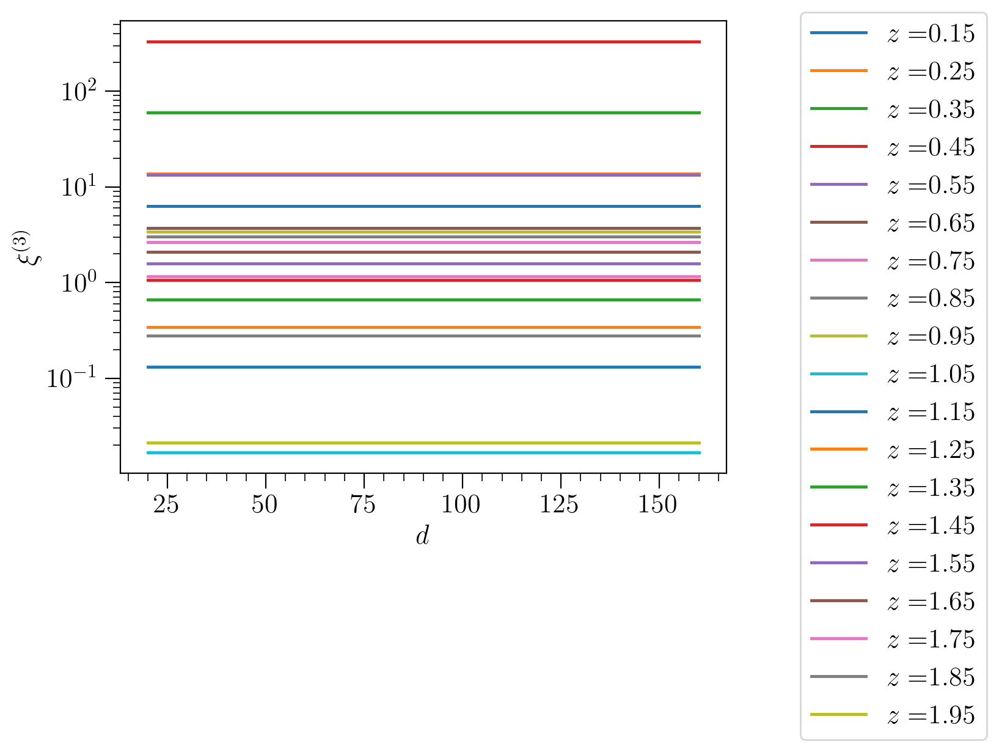

In [69]:
for k,_ in enumerate(z_bins):
    plt.plot(dist[0], dsignal_dsM3_fit[k,int(8*36):int(9*36)]/octupoleBF[k], label=r'$z=$'+str(_))
    
plt.yscale('log')
plt.xlabel(r'$d$')
plt.ylabel(r'$\xi^{(3)}$')
plt.legend(bbox_to_anchor=(1.1, 1.05))

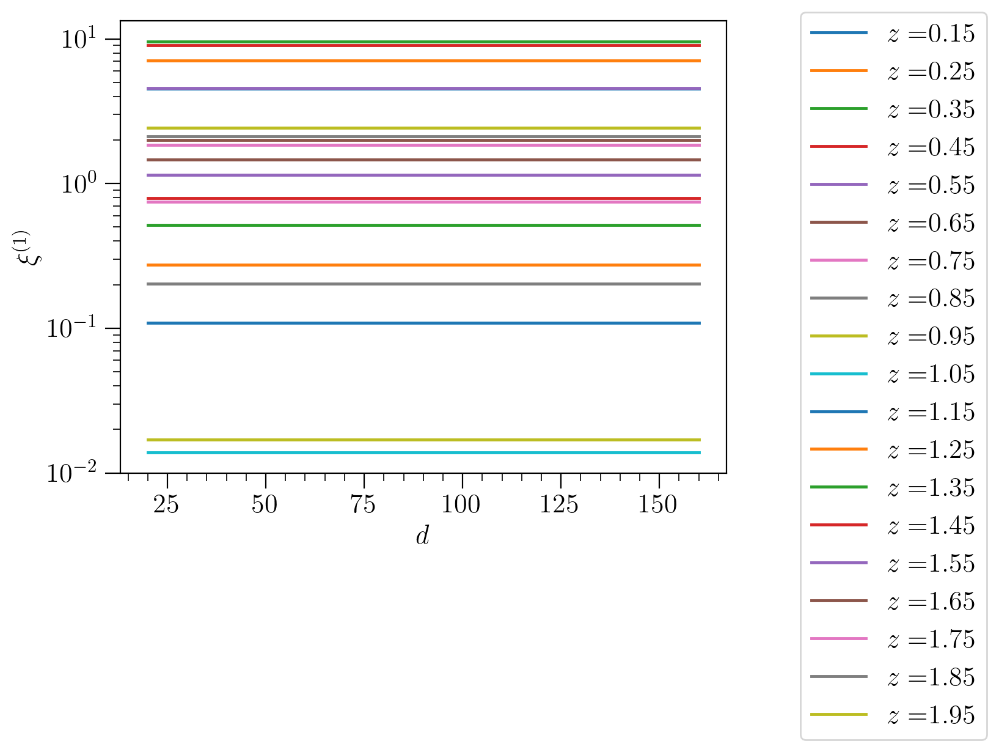

In [70]:
for k,_ in enumerate(z_bins):
    plt.plot(dist[0], dsignal_dsM3_fit[k,int(3*36):int(4*36)]/dipoleBF[k], label=r'$z=$'+str(_))
    
plt.yscale('log')
plt.xlabel(r'$d$')
plt.ylabel(r'$\xi^{(1)}$')
plt.legend(bbox_to_anchor=(1.1, 1.05))

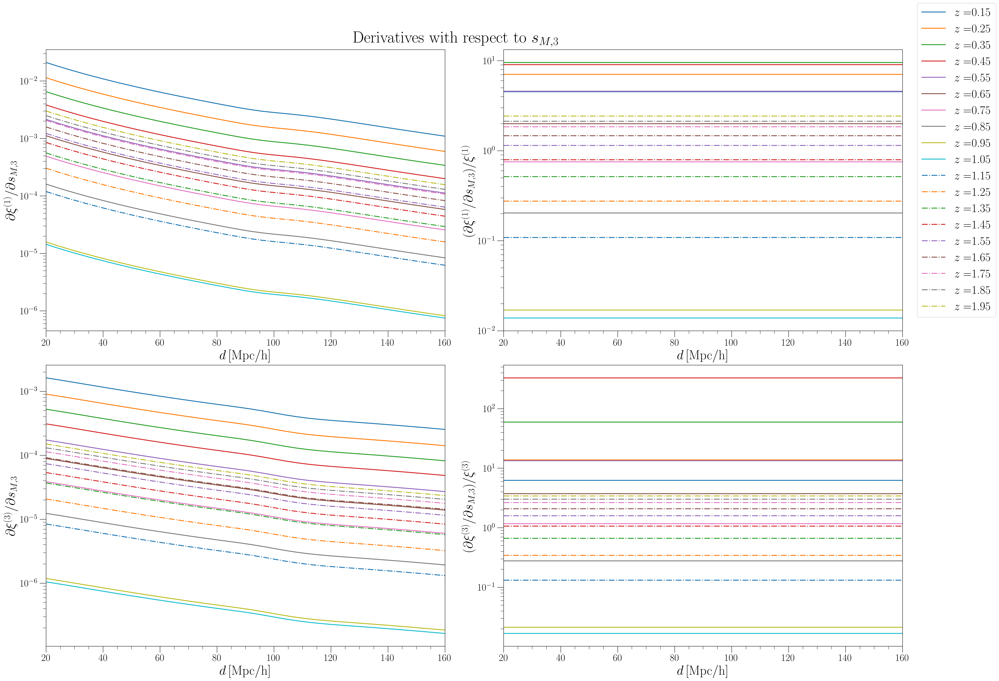

In [100]:
# Create a grid of plots (4 rows, 2 columns)

fig, axs = plt.subplots(2, 2, figsize=(28, 20), gridspec_kw={'hspace' : 0.0})

lss = ['-', '-.']

sep = dist[0]

line_width = 2.0

for k,_ in enumerate(z_bins):
    if _ < 1.15:
        axs[0,0].plot(dist[0], dsignal_dsM3_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[0])
        axs[0,1].plot(sep, dsignal_dsM3_fit[k,int(3*36):int(4*36)]/dipoleBF[k], linewidth = line_width, ls = lss[0])
        axs[1,0].plot(dist[0], dsignal_dsM3_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[0])
        axs[1,1].plot(sep, dsignal_dsM3_fit[k,int(8*36):int(9*36)]/octupoleBF[k], linewidth = line_width, ls = lss[0])
    else:
        axs[0,0].plot(dist[0], dsignal_dsM3_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[1])
        axs[0,1].plot(sep, dsignal_dsM3_fit[k,int(3*36):int(4*36)]/dipoleBF[k], linewidth = line_width, ls = lss[1])
        axs[1,0].plot(dist[0], dsignal_dsM3_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[1])
        axs[1,1].plot(sep, dsignal_dsM3_fit[k,int(8*36):int(9*36)]/octupoleBF[k], linewidth = line_width, ls = lss[1])



# Set y-axis labels for the first column (1st subplot in each row)

axs[0,0].set_ylabel(r'$\partial\xi^{(1)}/\partial s_{M,3}$')
axs[1,0].set_ylabel(r'$\partial\xi^{(3)}/\partial s_{M,3}$')
axs[0,1].set_ylabel(r'$(\partial\xi^{(1)}/\partial s_{M,3})/\xi^{(1)}$')
axs[1,1].set_ylabel(r'$(\partial\xi^{(3)}/\partial s_{M,3})/\xi^{(3)}$')

axs[0,0].set_yscale('log')
axs[1,0].set_yscale('log')
axs[0,1].set_yscale('log')
axs[1,1].set_yscale('log')

# Add extra space between y-axis label and tick params

#axs[0, 0].yaxis.set_label_coords(-0.095, 0.5)
#axs[1, 0].yaxis.set_label_coords(-0.075, 0.5)
#axs[0, 1].yaxis.set_label_coords(-0.1175, 0.5)
#axs[1, 1].yaxis.set_label_coords(-0.075, 0.5)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlim(left=20, right=160)
    axs[1, i].set_xlim(left=20, right=160)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')
    axs[1, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')

# Increase tick, label, and legend font sizes

for i in range(2):
    for j in range(2):
        axs[i, j].tick_params(axis='both', which='major', labelsize=22, size=14)
        axs[i, j].tick_params(axis='both', which='minor', size=7)
        axs[i, j].xaxis.label.set_size(29)
        axs[i, j].yaxis.label.set_size(29)
        

# Create a legend for the first subplot (axs[0, 0])

plt.suptitle('Derivatives with respect to '+r'$s_{M,3}$', fontsize = 36)

fig.legend(bbox_to_anchor=(1.1, 1.05), fontsize=26)
 
fig.set_constrained_layout(True)

plt.savefig("plots/derivatives_sM_3.pdf", bbox_inches='tight')

## Other Derivatives

In [72]:
dsignal_dsM0_fit = dsignal_dsM_fit[0,:,:]
dsignal_dsM1_fit = dsignal_dsM_fit[1,:,:]
dsignal_dsM2_fit = dsignal_dsM_fit[2,:,:]


np.shape(dsignal_dsM0_fit), np.shape(dsignal_dsM1_fit), np.shape(dsignal_dsM2_fit)

((19, 324), (19, 324), (19, 324))

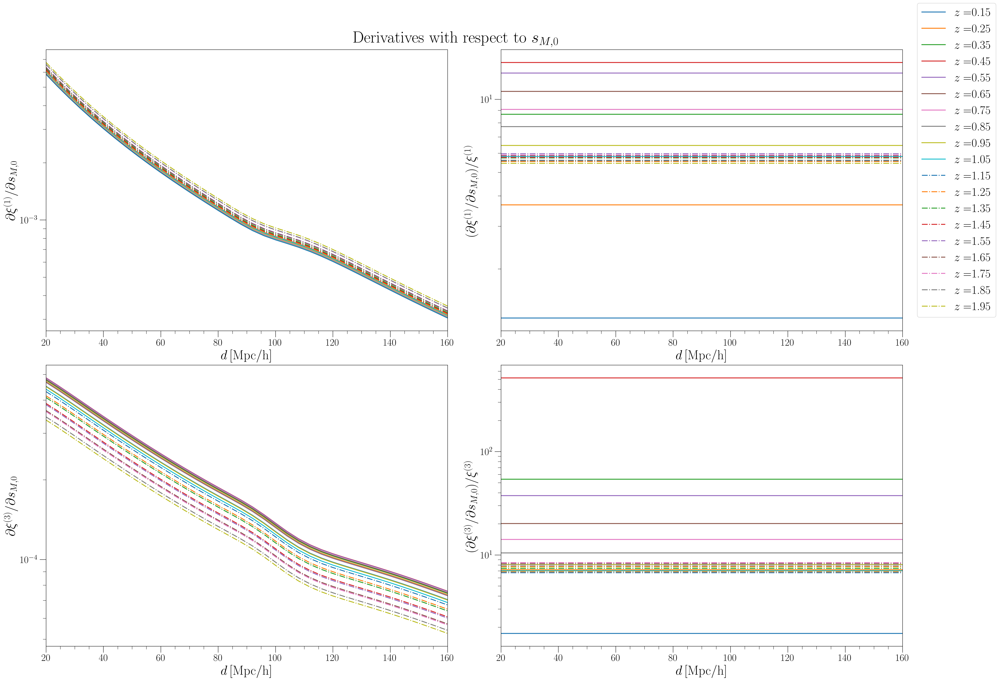

In [101]:
# Create a grid of plots (4 rows, 2 columns)

fig, axs = plt.subplots(2, 2, figsize=(28, 20), gridspec_kw={'hspace' : 0.0})

lss = ['-', '-.']

sep = dist[0]

line_width = 2.0

for k,_ in enumerate(z_bins):
    if _ < 1.15:
        axs[0,0].plot(dist[0], dsignal_dsM0_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[0])
        axs[0,1].plot(sep, dsignal_dsM0_fit[k,int(3*36):int(4*36)]/dipoleBF[k], linewidth = line_width, ls = lss[0])
        axs[1,0].plot(dist[0], dsignal_dsM0_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[0])
        axs[1,1].plot(sep, dsignal_dsM0_fit[k,int(8*36):int(9*36)]/octupoleBF[k], linewidth = line_width, ls = lss[0])
    else:
        axs[0,0].plot(dist[0], dsignal_dsM0_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[1])
        axs[0,1].plot(sep, dsignal_dsM0_fit[k,int(3*36):int(4*36)]/dipoleBF[k], linewidth = line_width, ls = lss[1])
        axs[1,0].plot(dist[0], dsignal_dsM0_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[1])
        axs[1,1].plot(sep, dsignal_dsM0_fit[k,int(8*36):int(9*36)]/octupoleBF[k], linewidth = line_width, ls = lss[1])



# Set y-axis labels for the first column (1st subplot in each row)

axs[0,0].set_ylabel(r'$\partial\xi^{(1)}/\partial s_{M,0}$')
axs[1,0].set_ylabel(r'$\partial\xi^{(3)}/\partial s_{M,0}$')
axs[0,1].set_ylabel(r'$(\partial\xi^{(1)}/\partial s_{M,0})/\xi^{(1)}$')
axs[1,1].set_ylabel(r'$(\partial\xi^{(3)}/\partial s_{M,0})/\xi^{(3)}$')

axs[0,0].set_yscale('log')
axs[1,0].set_yscale('log')
axs[0,1].set_yscale('log')
axs[1,1].set_yscale('log')

# Add extra space between y-axis label and tick params

#axs[0, 0].yaxis.set_label_coords(-0.095, 0.5)
#axs[1, 0].yaxis.set_label_coords(-0.075, 0.5)
#axs[0, 1].yaxis.set_label_coords(-0.1175, 0.5)
#axs[1, 1].yaxis.set_label_coords(-0.075, 0.5)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlim(left=20, right=160)
    axs[1, i].set_xlim(left=20, right=160)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')
    axs[1, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')

# Increase tick, label, and legend font sizes

for i in range(2):
    for j in range(2):
        axs[i, j].tick_params(axis='both', which='major', labelsize=22, size=14)
        axs[i, j].tick_params(axis='both', which='minor', size=7)
        axs[i, j].xaxis.label.set_size(29)
        axs[i, j].yaxis.label.set_size(29)
        

# Create a legend for the first subplot (axs[0, 0])

plt.suptitle('Derivatives with respect to '+r'$s_{M,0}$', fontsize = 36)

fig.legend(bbox_to_anchor=(1.1, 1.05), fontsize=26)
 
fig.set_constrained_layout(True)

plt.savefig("plots/derivatives_sM_0.pdf", bbox_inches='tight')

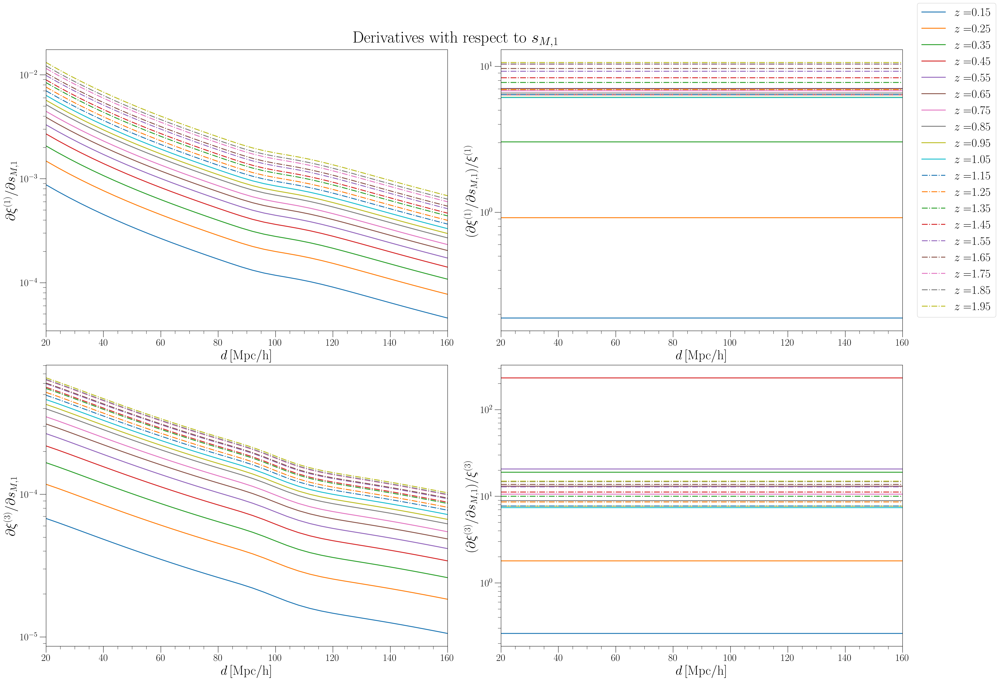

In [102]:
# Create a grid of plots (4 rows, 2 columns)

fig, axs = plt.subplots(2, 2, figsize=(28, 20), gridspec_kw={'hspace' : 0.0})

lss = ['-', '-.']

sep = dist[0]

line_width = 2.0

for k,_ in enumerate(z_bins):
    if _ < 1.15:
        axs[0,0].plot(dist[0], dsignal_dsM1_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[0])
        axs[0,1].plot(sep, dsignal_dsM1_fit[k,int(3*36):int(4*36)]/dipoleBF[k], linewidth = line_width, ls = lss[0])
        axs[1,0].plot(dist[0], dsignal_dsM1_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[0])
        axs[1,1].plot(sep, dsignal_dsM1_fit[k,int(8*36):int(9*36)]/octupoleBF[k], linewidth = line_width, ls = lss[0])
    else:
        axs[0,0].plot(dist[0], dsignal_dsM1_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[1])
        axs[0,1].plot(sep, dsignal_dsM1_fit[k,int(3*36):int(4*36)]/dipoleBF[k], linewidth = line_width, ls = lss[1])
        axs[1,0].plot(dist[0], dsignal_dsM1_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[1])
        axs[1,1].plot(sep, dsignal_dsM1_fit[k,int(8*36):int(9*36)]/octupoleBF[k], linewidth = line_width, ls = lss[1])



# Set y-axis labels for the first column (1st subplot in each row)

axs[0,0].set_ylabel(r'$\partial\xi^{(1)}/\partial s_{M,1}$')
axs[1,0].set_ylabel(r'$\partial\xi^{(3)}/\partial s_{M,1}$')
axs[0,1].set_ylabel(r'$(\partial\xi^{(1)}/\partial s_{M,1})/\xi^{(1)}$')
axs[1,1].set_ylabel(r'$(\partial\xi^{(3)}/\partial s_{M,1})/\xi^{(3)}$')

axs[0,0].set_yscale('log')
axs[1,0].set_yscale('log')
axs[0,1].set_yscale('log')
axs[1,1].set_yscale('log')

# Add extra space between y-axis label and tick params

#axs[0, 0].yaxis.set_label_coords(-0.095, 0.5)
#axs[1, 0].yaxis.set_label_coords(-0.075, 0.5)
#axs[0, 1].yaxis.set_label_coords(-0.1175, 0.5)
#axs[1, 1].yaxis.set_label_coords(-0.075, 0.5)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlim(left=20, right=160)
    axs[1, i].set_xlim(left=20, right=160)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')
    axs[1, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')

# Increase tick, label, and legend font sizes

for i in range(2):
    for j in range(2):
        axs[i, j].tick_params(axis='both', which='major', labelsize=22, size=14)
        axs[i, j].tick_params(axis='both', which='minor', size=7)
        axs[i, j].xaxis.label.set_size(29)
        axs[i, j].yaxis.label.set_size(29)
        

# Create a legend for the first subplot (axs[0, 0])

plt.suptitle('Derivatives with respect to '+r'$s_{M,1}$', fontsize = 36)

fig.legend(bbox_to_anchor=(1.1, 1.05), fontsize=26)
 
fig.set_constrained_layout(True)

plt.savefig("plots/derivatives_sM_1.pdf", bbox_inches='tight')

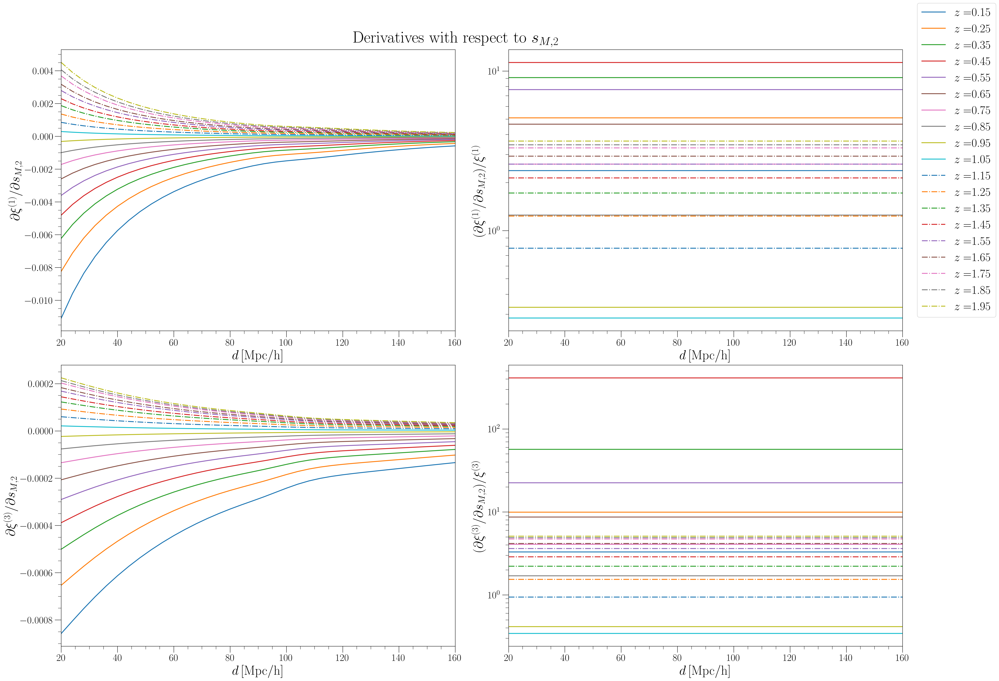

In [105]:
# Create a grid of plots (4 rows, 2 columns)

fig, axs = plt.subplots(2, 2, figsize=(28, 20), gridspec_kw={'hspace' : 0.0})

lss = ['-', '-.']

sep = dist[0]

line_width = 2.0

for k,_ in enumerate(z_bins):
    if _ < 1.15:
        axs[0,0].plot(dist[0], dsignal_dsM2_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[0])
        axs[0,1].plot(sep, np.abs(dsignal_dsM2_fit[k,int(3*36):int(4*36)]/dipoleBF[k]), linewidth = line_width, ls = lss[0])
        axs[1,0].plot(dist[0], dsignal_dsM2_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[0])
        axs[1,1].plot(sep, np.abs(dsignal_dsM2_fit[k,int(8*36):int(9*36)]/octupoleBF[k]), linewidth = line_width, ls = lss[0])
    else:
        axs[0,0].plot(dist[0], dsignal_dsM2_fit[k,int(3*36):int(4*36)], label=r'$z=$'+str(_), linewidth = line_width, ls = lss[1])
        axs[0,1].plot(sep, np.abs(dsignal_dsM2_fit[k,int(3*36):int(4*36)]/dipoleBF[k]), linewidth = line_width, ls = lss[1])
        axs[1,0].plot(dist[0], dsignal_dsM2_fit[k,int(8*36):int(9*36)], linewidth = line_width, ls = lss[1])
        axs[1,1].plot(sep, np.abs(dsignal_dsM2_fit[k,int(8*36):int(9*36)]/octupoleBF[k]), linewidth = line_width, ls = lss[1])



# Set y-axis labels for the first column (1st subplot in each row)

axs[0,0].set_ylabel(r'$\partial\xi^{(1)}/\partial s_{M,2}$')
axs[1,0].set_ylabel(r'$\partial\xi^{(3)}/\partial s_{M,2}$')
axs[0,1].set_ylabel(r'$(\partial\xi^{(1)}/\partial s_{M,2})/\xi^{(1)}$')
axs[1,1].set_ylabel(r'$(\partial\xi^{(3)}/\partial s_{M,2})/\xi^{(3)}$')

#axs[0,0].set_yscale('log')
#axs[1,0].set_yscale('log')
axs[0,1].set_yscale('log')
axs[1,1].set_yscale('log')

# Add extra space between y-axis label and tick params

#axs[0, 0].yaxis.set_label_coords(-0.095, 0.5)
#axs[1, 0].yaxis.set_label_coords(-0.075, 0.5)
#axs[0, 1].yaxis.set_label_coords(-0.1175, 0.5)
#axs[1, 1].yaxis.set_label_coords(-0.075, 0.5)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlim(left=20, right=160)
    axs[1, i].set_xlim(left=20, right=160)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')
    axs[1, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')

# Increase tick, label, and legend font sizes

for i in range(2):
    for j in range(2):
        axs[i, j].tick_params(axis='both', which='major', labelsize=22, size=14)
        axs[i, j].tick_params(axis='both', which='minor', size=7)
        axs[i, j].xaxis.label.set_size(29)
        axs[i, j].yaxis.label.set_size(29)
        

# Create a legend for the first subplot (axs[0, 0])

plt.suptitle('Derivatives with respect to ' + r'$s_{M,2}$', fontsize = 36)

fig.legend(bbox_to_anchor=(1.1, 1.05), fontsize=26)
 
fig.set_constrained_layout(True)

plt.savefig("plots/derivatives_sM_2.pdf", bbox_inches='tight')

## Additional test

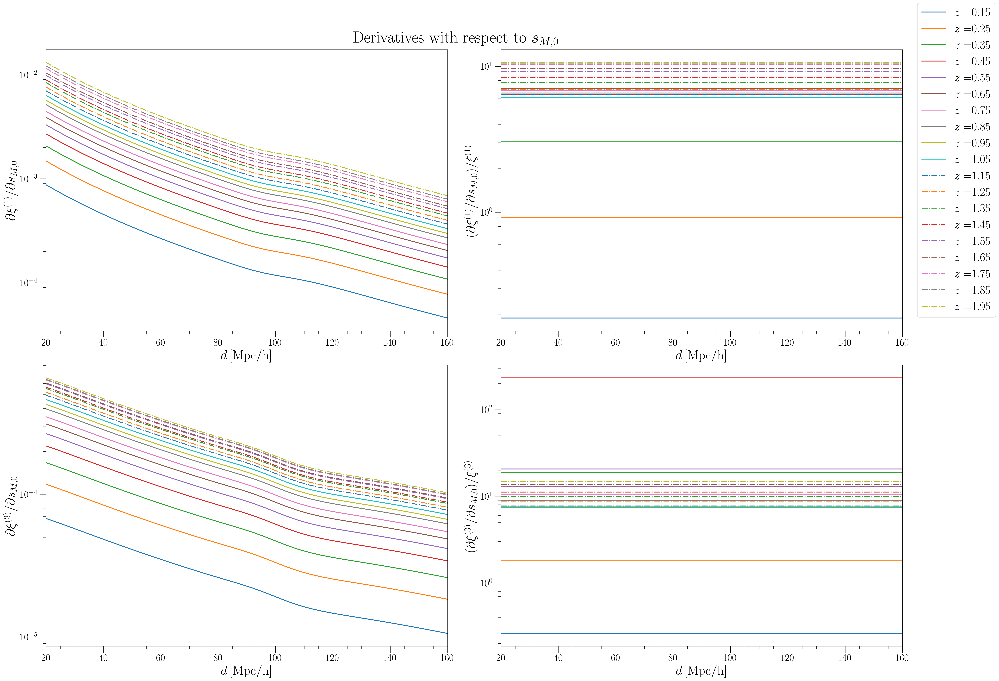

In [110]:
# Create a grid of plots (4 rows, 2 columns)

fig, axs = plt.subplots(2, 2, figsize=(28, 20), gridspec_kw={'hspace' : 0.0})

lss = ['-', '-.']

sep = dist[0]

def fac(x):
    return x

line_width = 2.0

for k,_ in enumerate(z_bins):
    if _ < 1.15:
        axs[0,0].plot(dist[0], dsignal_dsM0_fit[k,int(3*36):int(4*36)]*fac(_), label=r'$z=$'+str(_), linewidth = line_width, ls = lss[0])
        axs[0,1].plot(sep, dsignal_dsM0_fit[k,int(3*36):int(4*36)]/dipoleBF[k]*fac(_), linewidth = line_width, ls = lss[0])
        axs[1,0].plot(dist[0], dsignal_dsM0_fit[k,int(8*36):int(9*36)]*fac(_), linewidth = line_width, ls = lss[0])
        axs[1,1].plot(sep, dsignal_dsM0_fit[k,int(8*36):int(9*36)]/octupoleBF[k]*fac(_), linewidth = line_width, ls = lss[0])
    else:
        axs[0,0].plot(dist[0], dsignal_dsM0_fit[k,int(3*36):int(4*36)]*fac(_), label=r'$z=$'+str(_), linewidth = line_width, ls = lss[1])
        axs[0,1].plot(sep, dsignal_dsM0_fit[k,int(3*36):int(4*36)]/dipoleBF[k]*fac(_), linewidth = line_width, ls = lss[1])
        axs[1,0].plot(dist[0], dsignal_dsM0_fit[k,int(8*36):int(9*36)]*fac(_), linewidth = line_width, ls = lss[1])
        axs[1,1].plot(sep, dsignal_dsM0_fit[k,int(8*36):int(9*36)]/octupoleBF[k]*fac(_), linewidth = line_width, ls = lss[1])



# Set y-axis labels for the first column (1st subplot in each row)

axs[0,0].set_ylabel(r'$\partial\xi^{(1)}/\partial s_{M,0}$')
axs[1,0].set_ylabel(r'$\partial\xi^{(3)}/\partial s_{M,0}$')
axs[0,1].set_ylabel(r'$(\partial\xi^{(1)}/\partial s_{M,0})/\xi^{(1)}$')
axs[1,1].set_ylabel(r'$(\partial\xi^{(3)}/\partial s_{M,0})/\xi^{(3)}$')

axs[0,0].set_yscale('log')
axs[1,0].set_yscale('log')
axs[0,1].set_yscale('log')
axs[1,1].set_yscale('log')

# Add extra space between y-axis label and tick params

#axs[0, 0].yaxis.set_label_coords(-0.095, 0.5)
#axs[1, 0].yaxis.set_label_coords(-0.075, 0.5)
#axs[0, 1].yaxis.set_label_coords(-0.1175, 0.5)
#axs[1, 1].yaxis.set_label_coords(-0.075, 0.5)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlim(left=20, right=160)
    axs[1, i].set_xlim(left=20, right=160)

# Set labels for the x-axes in the bottom row

for i in range(2):
    axs[0, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')
    axs[1, i].set_xlabel(r'$d\,\mathrm{[Mpc/h]}$')

# Increase tick, label, and legend font sizes

for i in range(2):
    for j in range(2):
        axs[i, j].tick_params(axis='both', which='major', labelsize=22, size=14)
        axs[i, j].tick_params(axis='both', which='minor', size=7)
        axs[i, j].xaxis.label.set_size(29)
        axs[i, j].yaxis.label.set_size(29)
        

# Create a legend for the first subplot (axs[0, 0])

plt.suptitle('Derivatives with respect to '+r'$s_{M,0}$', fontsize = 36)

fig.legend(bbox_to_anchor=(1.1, 1.05), fontsize=26)
 
fig.set_constrained_layout(True)

#plt.savefig("plots/derivatives_sM_0.pdf", bbox_inches='tight')